In [1]:
##IMPORTS##
#should be put in and downloaded from a requirements.txt file if necessary
import os
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
import re
import nltk
import sklearn
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
import seaborn as sns
import torch
from torch import nn
import random
import geopandas as gpd
import descartes
import scipy.stats as stats
import statsmodels.api as sm
from dateutil import parser
import datetime

# Data imports

This data is taken from Ventyx VelocitySuite

In [2]:
#load in data from csvs
MISO_AS = pd.read_csv("miso_as.csv",encoding = "ISO-8859-1")
MISO_LMP = pd.read_csv("miso_lmp.csv",encoding = "ISO-8859-1")
MISO_Zonal_Load = pd.read_csv("miso_zonal_load.csv",encoding = "ISO-8859-1")
MISO_Load_Forecast = pd.read_csv("miso_load_forecasterror.csv",encoding = "ISO-8859-1")
MISO_Zonal_Gen = pd.read_csv("miso_gen.csv",encoding = "ISO-8859-1")
MISO_Zonal_Gen_Forecast = pd.read_csv("miso_gen_forecast.csv",encoding = "ISO-8859-1")

MISO_Interface_Congestion = pd.read_csv('miso_rt_interface_congestion.csv',encoding="ISO-8859-1")
MISO_Hub_Congestion = pd.read_csv('miso_hub_congestion.csv',encoding="ISO-8859-1")
MISO_Outage_Forecast = pd.read_csv('miso_gen_outage_forecast.csv',encoding="ISO-8859-1")

Just preliminary curiosity if LMPs have been much lower this March than in previous years. We'll do more sophisticated stuff later. 

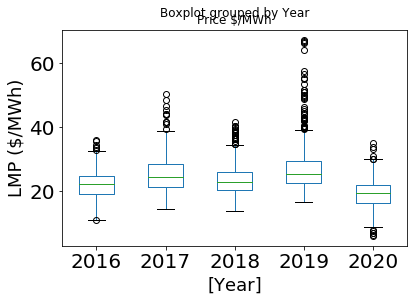

In [3]:
#March Price Boxplot
def boxplot_prices(df,month,hub="ILLINOIS.HUB",pricetype="MISO-DAH LMP"):
    
    month_frame = df.loc[(df['Price Node Name']==hub) & (df['Month']==month) & (df['Price Type Full Description']==pricetype)]
    axes2 = plt.axes()
    axes2.set_ylabel('LMP ($/MWh)',fontsize=18)
    axes2.set_xlabel('Year',fontsize=18)
    axes2.set_title("March LMP",fontsize=24)
    month_frame.boxplot(column=['Price $/MWh'], by=['Year'],ax=axes2,grid=False,fontsize=20)
    
boxplot_prices(MISO_LMP,3)

A slightly more sophisticated look at prices by producing duration curves of DA prices at a few different MISO hubs. Again, nothing stands out to me here as truly atypical in March 2020. Prices are lower than in most previous years, but it looks like at the hubs where this is true the prices were also lower in February, which suggests the cause is something other than COVID. 

C:\Users\llavi\Anaconda4\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


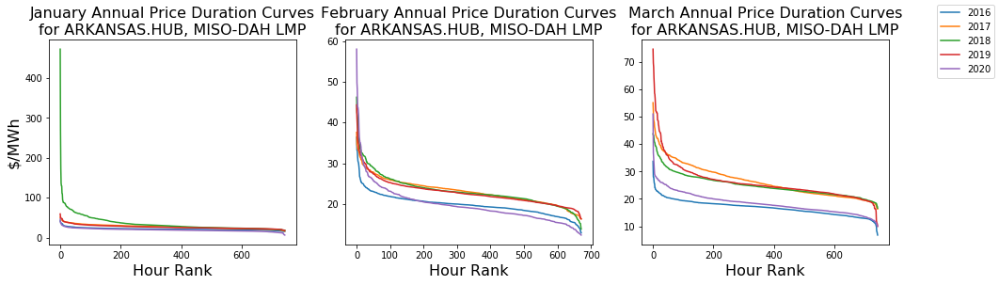

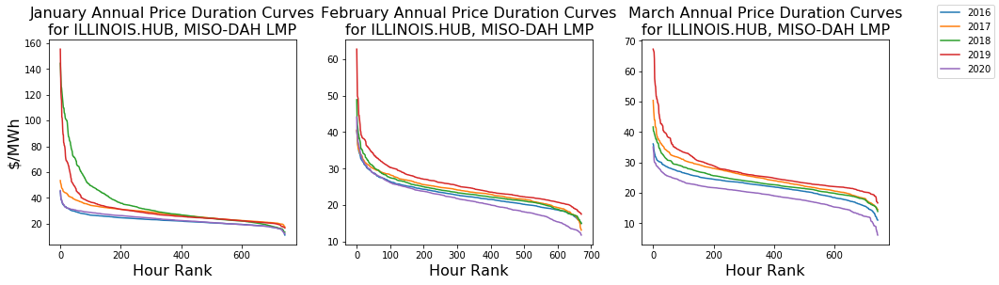

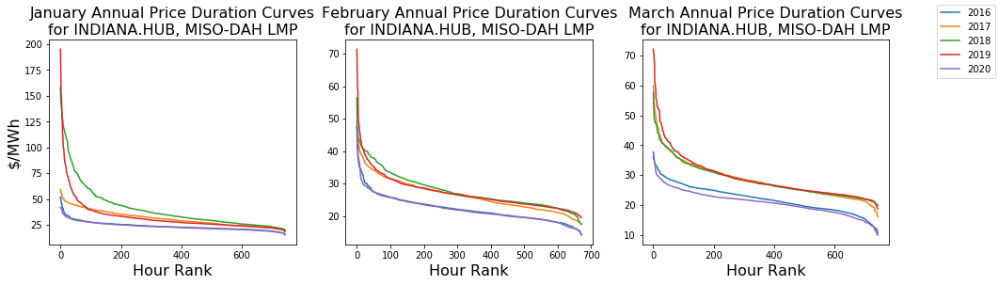

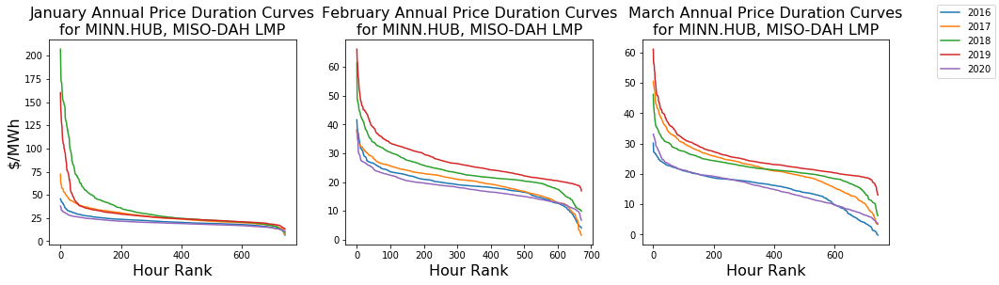

In [4]:
#Price duration curve for a month
def pdc(df,m_list,hub="ILLINOIS.HUB",pricetype="MISO-DAH LMP"):
    
    assert(type(m_list))==list
    fig, axs = plt.subplots(nrows=1,ncols=3,figsize=(16, 4))
    counter = 0
    
    for month in m_list:
        month_frame = df.loc[(df['Price Node Name']==hub) & (df['Month']==month) & (df['Price Type Full Description']==pricetype)]
        if month==2:
            month_frame = month_frame.loc[month_frame['Day']!=29] #drop leap day

        data_dict = {}
        for y in month_frame['Year'].unique():
            year_frame = month_frame.loc[df['Year']==y]
            year_frame.sort_values(by='Price $/MWh',ascending=False,inplace=True)
            year_frame.reset_index(inplace=True)
            #data_dict[str(y)] = list(year_frame['Price $/MWh'])
            axs[counter].plot(np.asarray(year_frame.index),np.asarray(year_frame['Price $/MWh']),label=str(y))

        #plot_frame = pd.DataFrame.from_dict(data_dict)
        month_name = datetime.date(1900, int(month), 1).strftime('%B')
        axs[counter].set_title(month_name+" Annual Price Duration Curves\nfor "+hub+", "+pricetype,fontdict={'fontsize': '16', 'fontweight' : '1'})
        if counter==0:
            axs[counter].set_ylabel('$/MWh',fontdict={'fontsize': '16', 'fontweight' : '1'})
        axs[counter].set_xlabel('Hour Rank',fontdict={'fontsize': '16', 'fontweight' : '1'})
        
        if counter==0:
            lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
            lines, labels = [sum(i, []) for i in zip(*lines_labels)]
            fig.legend(lines, labels, loc='upper right')
        counter+=1
    plt.show()
    return None
for node in MISO_LMP['Price Node Name'].unique():
    pdc(MISO_LMP,[1,2,3],hub=node)

After doing price duration curves, I figured I would also look at load duration curves. 

Again, nothing really stands out. Maybe MISO Central loads look a fair bit lower in March 2020 than they were in February 2020 compared to previous years.

C:\Users\llavi\Anaconda4\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


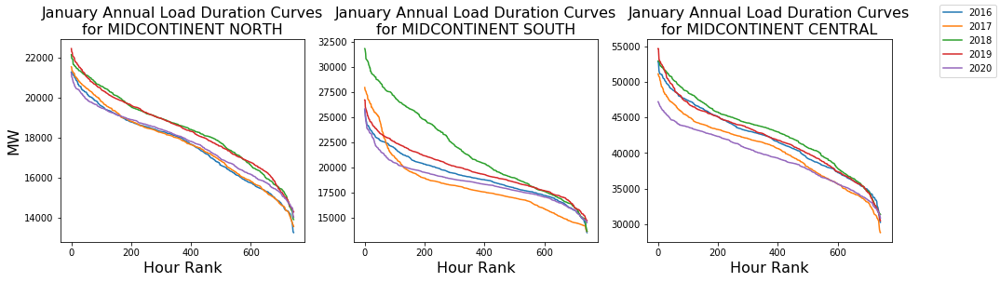

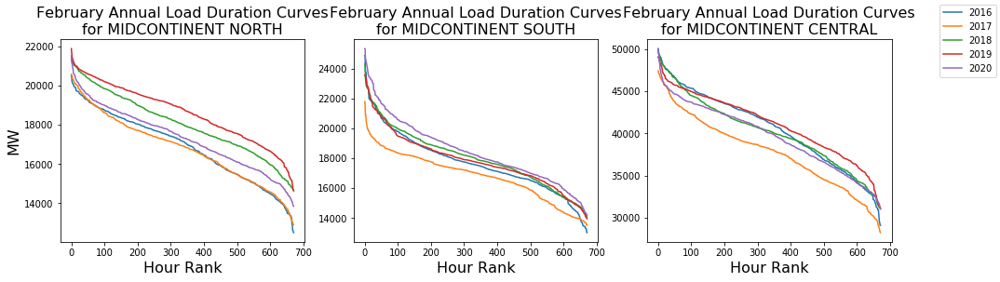

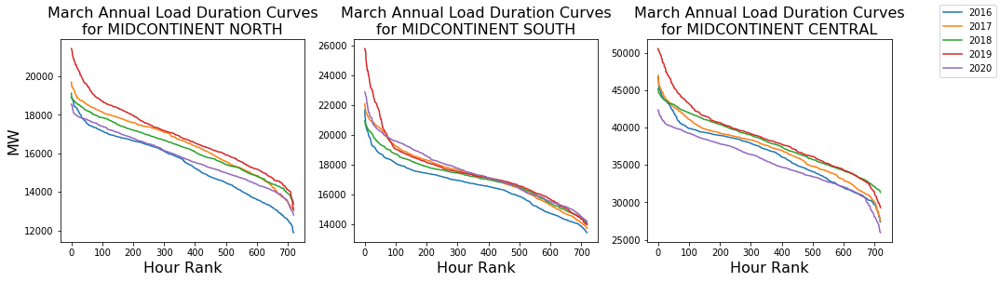

In [5]:
#load duration curves
def ldc(df,month,regions=["MIDCONTINENT NORTH","MIDCONTINENT SOUTH",'MIDCONTINENT CENTRAL']):
    fig, axs = plt.subplots(nrows=1, ncols=3,figsize=(16, 4))
    counter = 0
    
    for r in regions:
        month_frame = df.loc[(df['Load Region']==r) & (df['Month']==month)]
        if month==2:
            month_frame = month_frame.loc[month_frame['Day']!=29] #drop leap day
        if month==3:
            month_frame = month_frame.loc[month_frame['Day']!=31]

        data_dict = {}
        for y in month_frame['Year'].unique():
            year_frame = month_frame.loc[df['Year']==y]
            year_frame.sort_values(by='Load MW',ascending=False,inplace=True)
            year_frame.reset_index(inplace=True)
            #print(len(list(year_frame['Load MW'])))
            data_dict[str(y)] = list(year_frame['Load MW'])
            axs[counter].plot(np.asarray(year_frame.index),np.asarray(year_frame['Load MW']),label=str(y))

        plot_frame = pd.DataFrame.from_dict(data_dict) #likely defunct
        
        month_name = datetime.date(1900, int(month), 1).strftime('%B')
        axs[counter].set_title(month_name+" Annual Load Duration Curves\nfor "+r,fontdict={'fontsize': '16', 'fontweight' : '1'})
        if counter==0:
            axs[counter].set_ylabel('MW',fontdict={'fontsize': '16', 'fontweight' : '1'})
        axs[counter].set_xlabel('Hour Rank',fontdict={'fontsize': '16', 'fontweight' : '1'})
        
        if counter==0:
            lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
            lines, labels = [sum(i, []) for i in zip(*lines_labels)]
            fig.legend(lines, labels, loc='upper right')
        counter+=1
        
    plt.show()
    return None
    
for m in [1,2,3]:
    ldc(MISO_Zonal_Load,m)

Here I try to look at the shape of hourly prices. I do this by month-hour (i.e., averaging all March Hour Ending 1 for the year, then Hour Ending 2, etc.), normalized by the monthly average price (so the average should be 1.0) to create the normalized hourly shape for the month.

What we'd be looking for is evidence that March 2020 is an outlier in shape, perhaps having a flatter shape in the middle of the day with folks staying home. It actually **does** look like there's evidence for this (it's clearest for the Arkansas Hub in the top right), though I wouldn't call the effect overly strong.

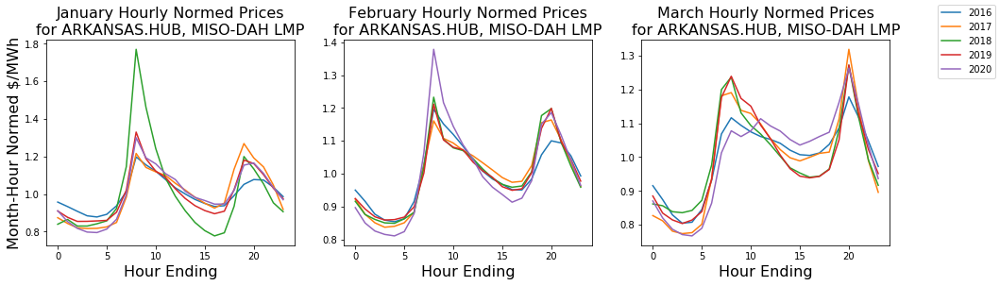

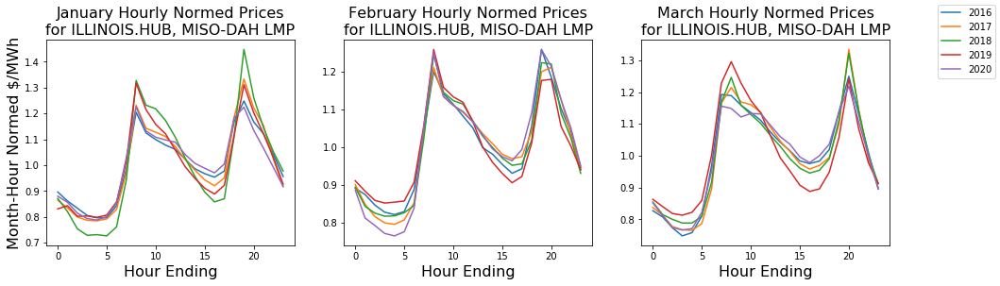

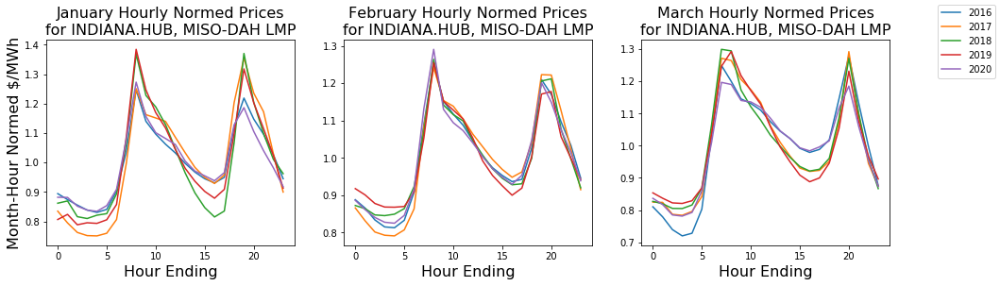

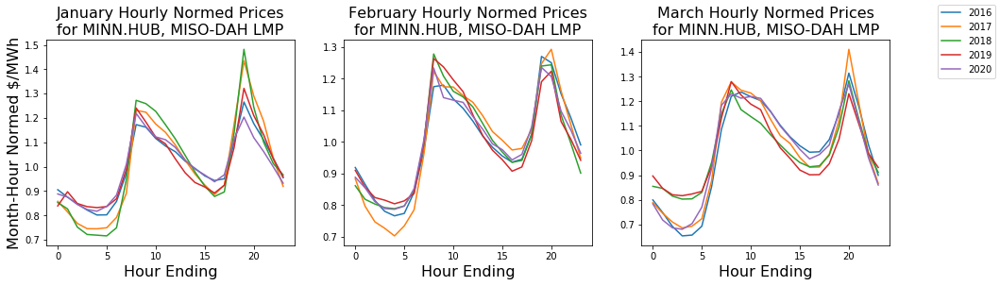

In [6]:
#Hourly average pricing
def pricenorm(df,m_list,hub="ILLINOIS.HUB",pricetype="MISO-DAH LMP"):
    
    assert(type(m_list))==list
    fig, axs = plt.subplots(nrows=1,ncols=3,figsize=(16, 4))
    counter = 0
    
    for month in m_list:
        month_frame = df.loc[(df['Price Node Name']==hub) & (df['Month']==month) & (df['Price Type Full Description']==pricetype)]
        if month==2:
            month_frame = month_frame.loc[month_frame['Day']!=29] #drop leap day

        data_dict = {}
        for y in month_frame['Year'].unique():
            year_frame = month_frame.loc[df['Year']==y]
            #print(year_frame['Price $/MWh'].mean())
            hour_frame = year_frame.groupby(['Hour']).mean()
            hour_frame['NormPrice'] = hour_frame['Price $/MWh']/(year_frame['Price $/MWh'].mean())
            axs[counter].plot(np.asarray(hour_frame.index),np.asarray(hour_frame['NormPrice']),label=str(y))

        plot_frame = pd.DataFrame.from_dict(data_dict)

        #fig, ax = plt.subplots()
        #myaxes = plt.axes()
        month_name = datetime.date(1900, int(month), 1).strftime('%B')
        axs[counter].set_title(month_name+" Hourly Normed Prices\nfor "+hub+", "+pricetype,fontdict={'fontsize': '16', 'fontweight' : '1'})
        if counter==0:
            axs[counter].set_ylabel('Month-Hour Normed $/MWh',fontdict={'fontsize': '16', 'fontweight' : '1'})
        axs[counter].set_xlabel('Hour Ending',fontdict={'fontsize': '16', 'fontweight' : '1'})
        #myplot = plot_frame.plot.line(ax=myaxes)
        if counter==0:
            lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
            lines, labels = [sum(i, []) for i in zip(*lines_labels)]
            fig.legend(lines, labels, loc='upper right')
        counter+=1
    plt.show()
    return None

for node in MISO_LMP['Price Node Name'].unique():
    pricenorm(MISO_LMP,[1,2,3],node)


Same as the previous panel of charts but for load instead of price.



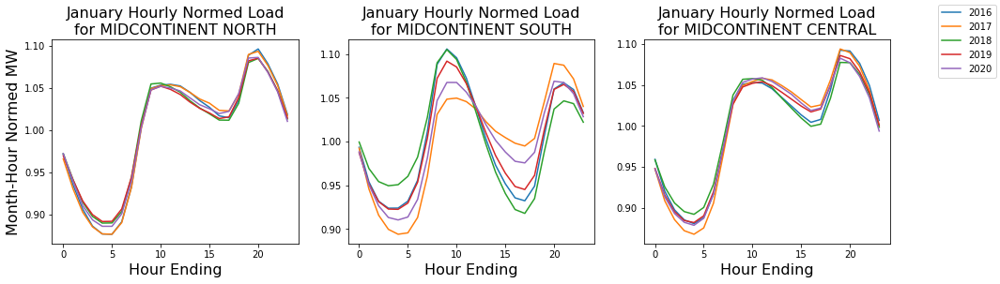

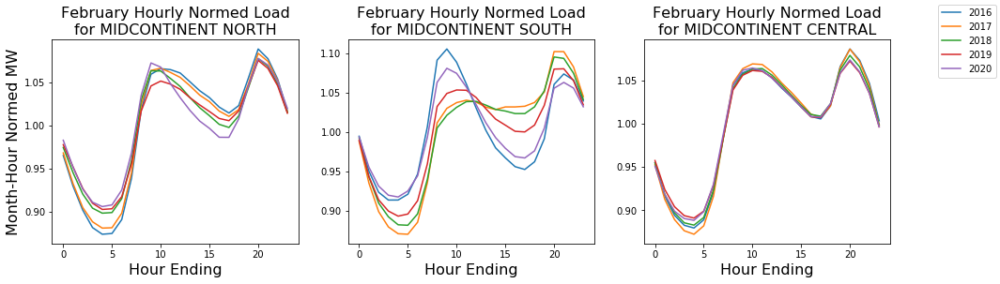

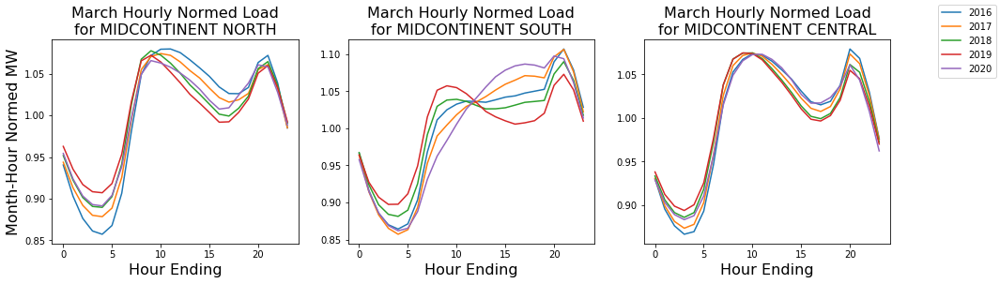

In [7]:
def ldc(df,month,regions=["MIDCONTINENT NORTH","MIDCONTINENT SOUTH",'MIDCONTINENT CENTRAL']):
    fig, axs = plt.subplots(nrows=1, ncols=3,figsize=(16, 4))
    counter = 0
    
    for r in regions:
        month_frame = df.loc[(df['Load Region']==r) & (df['Month']==month)]
        if month==2:
            month_frame = month_frame.loc[month_frame['Day']!=29] #drop leap day
        if month==3:
            month_frame = month_frame.loc[month_frame['Day']!=31]

        data_dict = {}
        for y in month_frame['Year'].unique():
            year_frame = month_frame.loc[df['Year']==y]
            hour_frame = year_frame.groupby(['Hour']).mean()
            hour_frame['NormLoad'] = hour_frame['Load MW']/(year_frame['Load MW'].mean())
            axs[counter].plot(np.asarray(hour_frame.index),np.asarray(hour_frame['NormLoad']),label=str(y))
            
        plot_frame = pd.DataFrame.from_dict(data_dict) #likely defunct
        
        month_name = datetime.date(1900, int(month), 1).strftime('%B')
        axs[counter].set_title(month_name+" Hourly Normed Load\nfor "+r,fontdict={'fontsize': '16', 'fontweight' : '1'})
        if counter==0:
            axs[counter].set_ylabel('Month-Hour Normed MW',fontdict={'fontsize': '16', 'fontweight' : '1'})
        axs[counter].set_xlabel('Hour Ending',fontdict={'fontsize': '16', 'fontweight' : '1'})
        
        if counter==0:
            lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
            lines, labels = [sum(i, []) for i in zip(*lines_labels)]
            fig.legend(lines, labels, loc='upper right')
        counter+=1
        
    plt.show()
    return None
    
for m in [1,2,3]:
    ldc(MISO_Zonal_Load,m)

Load forecast errors are the first to really provide a clear signal. It looks like the rolling average daily forecast error has, in fact, been increasing to levels that are historically atypical in the last couple weeks (top right panel makes this evident).

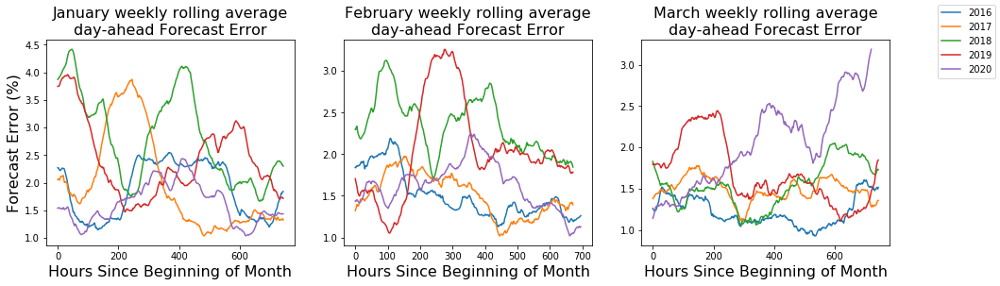

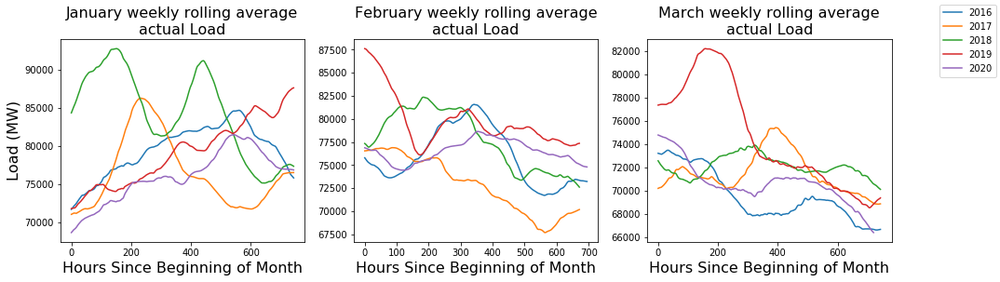

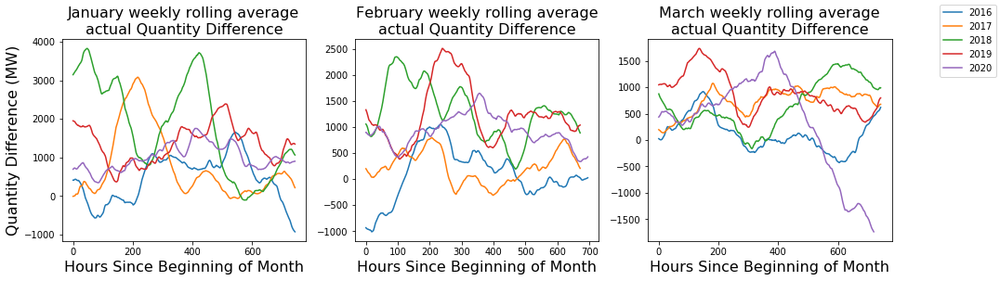

In [8]:
#load forecast errors MISO-wide
MISO_Load_Forecast['PythonDatetime'] = [parser.parse(v) for v in list(MISO_Load_Forecast['Local Datetime (Hour Ending)'])]
MISO_Load_Forecast['Month'] = [v.month for v in list(MISO_Load_Forecast['PythonDatetime'])]
MISO_Load_Forecast['Year'] = [v.year for v in list(MISO_Load_Forecast['PythonDatetime'])]

def rolling_forecast_error(df,m_list,colname,axis_label):    
    df['RollingAvg'] = df[colname].rolling(168).mean()
    counter = 0
    fig, axs = plt.subplots(nrows=1, ncols=3,figsize=(16, 4))
    for month in m_list:
        month_name = datetime.date(1900, int(month), 1).strftime('%B')
        month_frame = df.loc[df['Month']==month]
        
        for y in month_frame['Year'].unique():
            year_frame = month_frame.loc[df['Year']==y]
            year_frame.reset_index(inplace=True)
            axs[counter].plot(np.asarray(year_frame.index),np.asarray(year_frame['RollingAvg']),label=str(y))

        axs[counter].set_xlabel('Hours Since Beginning of Month',fontdict={'fontsize': '16', 'fontweight' : '1'})
        if counter==0:
            if 'Error' in axis_label:
                units = ' (%)'
            else:
                units = ' (MW)'
            axs[counter].set_ylabel(axis_label+units,fontdict={'fontsize': '16', 'fontweight' : '1'})
        
        if 'Error' in axis_label:
            temporal = 'day-ahead '
        else:
            temporal = 'actual '
        axs[counter].set_title(month_name+' weekly rolling average\n'+temporal+axis_label,
                               fontdict={'fontsize': '16', 'fontweight' : '3'})
        
        if counter==0:
            lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
            lines, labels = [sum(i, []) for i in zip(*lines_labels)]
            fig.legend(lines, labels, loc='upper right')
        counter+=1
    plt.savefig(axis_label+'Panel.png')
    plt.show()
    return None

rolling_forecast_error(MISO_Load_Forecast,[1,2,3],
                       'Absolute Value Day Ahead Forecast Error','Forecast Error')

rolling_forecast_error(MISO_Load_Forecast,[1,2,3],'Actual Load MW- Avg','Load')

rolling_forecast_error(MISO_Load_Forecast,[1,2,3],'Day Ahead Quantity Difference MW','Quantity Difference')

Ancillary services dataframe additions (take a bit to run so done separately)

In [10]:
#AS pricing additions to dataframe (takes a few seconds to run the list comprehensions)
MISO_AS['PythonDatetime'] = [parser.parse(v) for v in list(MISO_AS['Local Datetime (Hour Ending)'])]
MISO_AS['Month'] = [v.month for v in list(MISO_AS['PythonDatetime'])]
MISO_AS['Year'] = [v.year for v in list(MISO_AS['PythonDatetime'])]
MISO_AS['Day'] = [v.day for v in list(MISO_AS['PythonDatetime'])]

AS prices for a bunch of different products. I don't really see anything here. If anything 2020 AS prices seem lower for most products than most recent years. The thing that catches my eye most is that January 2018 seems to have had fairly high prices for a number of products - presumably it was quite cold.

Edit: Wikipedia [seems to back my intuition about 2018](https://en.wikipedia.org/wiki/2017%E2%80%9318_North_American_cold_wave).

C:\Users\llavi\Anaconda4\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


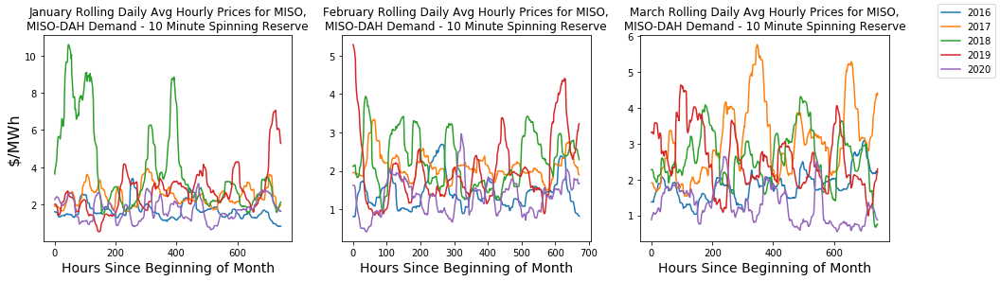

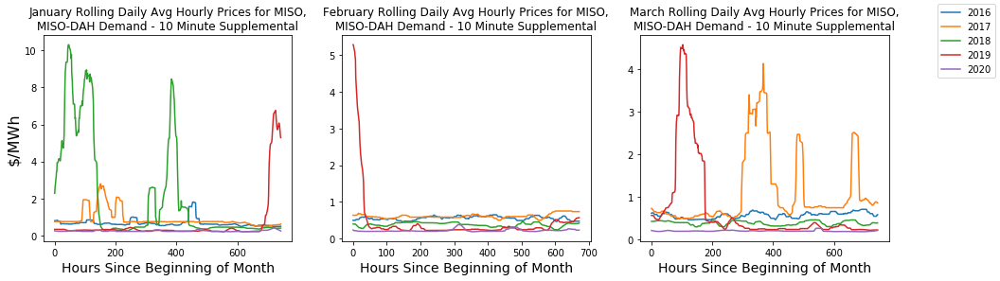

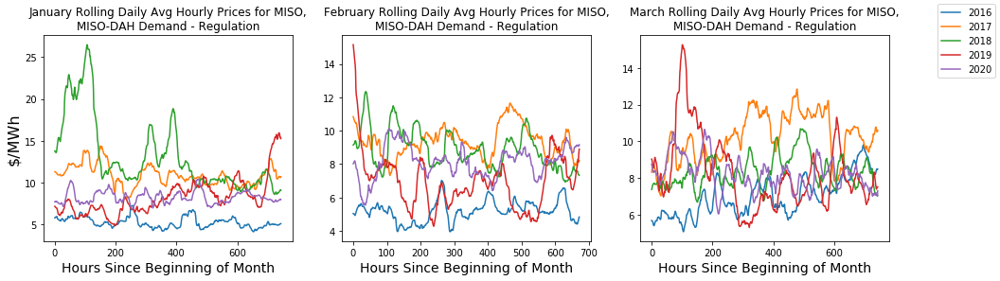

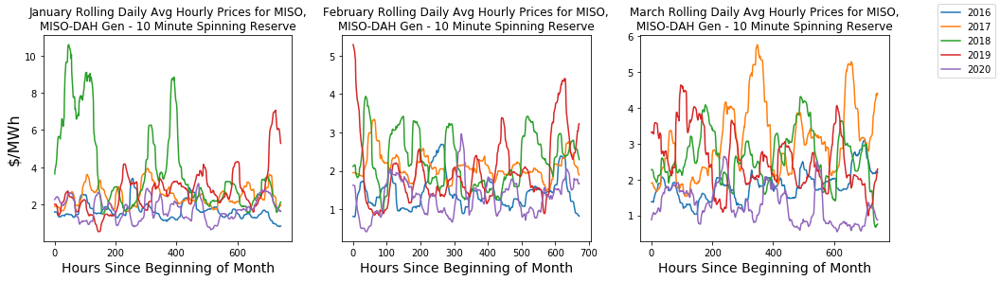

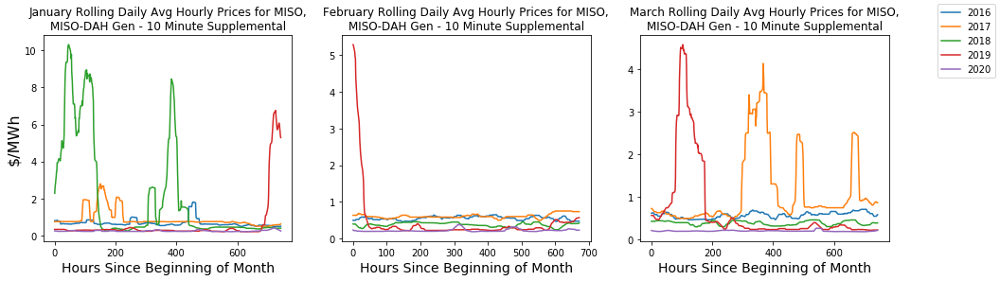

...

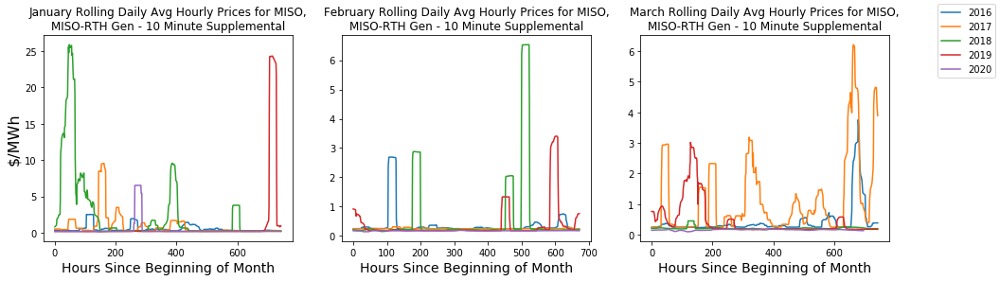

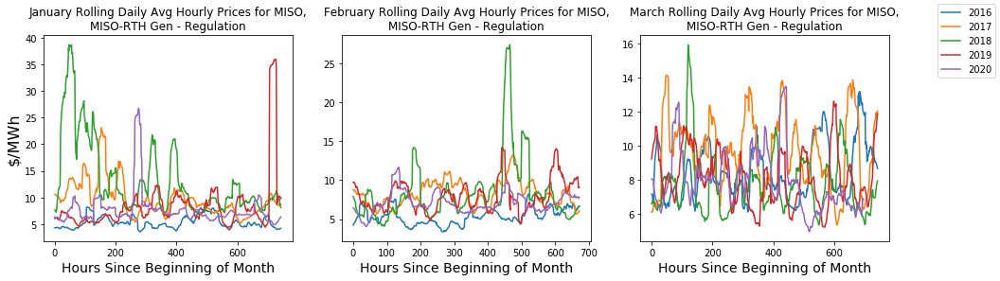

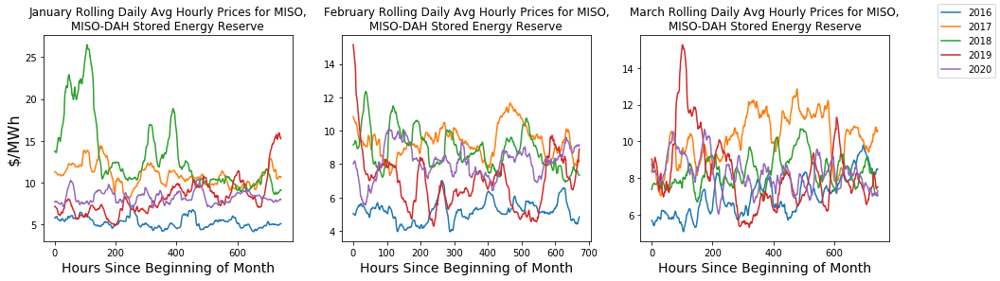

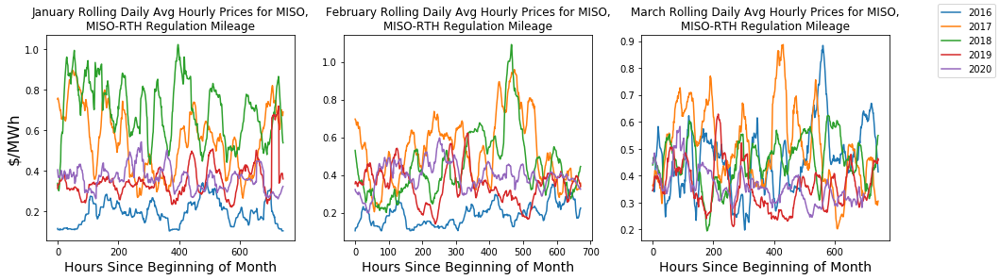

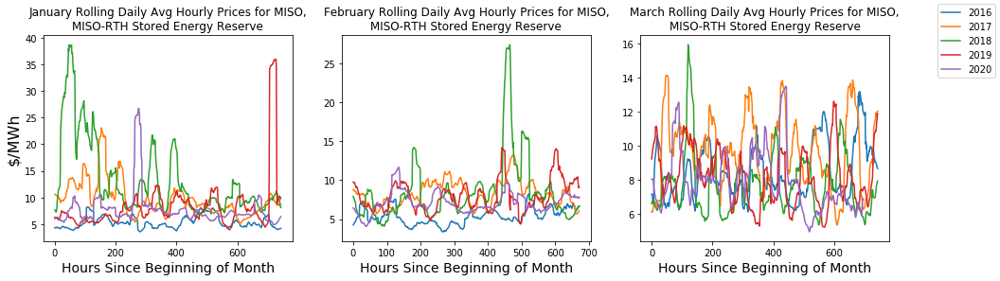

In [11]:
#AS plotting
def as_prices(df,m_list,hub="MISO",pricetype="MISO-DAH Demand - 10 Minute Spinning Reserve"):
    
    assert(type(m_list))==list
    fig, axs = plt.subplots(nrows=1,ncols=3,figsize=(16, 4))
    counter = 0
    
    sub_df = df.loc[(df['Price Node Name']==hub) & (df['Price Type Full Description']==pricetype)]
    sub_df['RollingAvg'] = sub_df['Price $/MWh'].rolling(24).mean()
    for month in m_list:
        month_frame = sub_df.loc[df['Month']==month]
        if month==2:
            month_frame = month_frame.loc[month_frame['Day']!=29] #drop leap day

        data_dict = {}
        for y in month_frame['Year'].unique():
            year_frame = month_frame.loc[df['Year']==y]
            year_frame.reset_index(inplace=True)
            axs[counter].plot(np.asarray(year_frame.index),np.asarray(year_frame['RollingAvg']),label=str(y))

        plot_frame = pd.DataFrame.from_dict(data_dict)

        #fig, ax = plt.subplots()
        #myaxes = plt.axes()
        month_name = datetime.date(1900, int(month), 1).strftime('%B')
        axs[counter].set_title(month_name+" Rolling Daily Avg Hourly Prices for "+hub+",\n"+pricetype,
                               fontdict={'fontsize': '12', 'fontweight' : '1'})
        if counter==0:
            axs[counter].set_ylabel('$/MWh',fontdict={'fontsize': '16', 'fontweight' : '1'})
        axs[counter].set_xlabel('Hours Since Beginning of Month',fontdict={'fontsize': '14', 'fontweight' : '1'})
        #myplot = plot_frame.plot.line(ax=myaxes)
        if counter==0:
            lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
            lines, labels = [sum(i, []) for i in zip(*lines_labels)]
            fig.legend(lines, labels, loc='upper right')
        counter+=1
    plt.show()
    return None

for p in MISO_AS['Price Type Full Description'].unique():
    as_prices(MISO_AS,[1,2,3],pricetype=p)

I realized one more question about prices might be whether negative RT prices are becoming more common if loads are decreased and wind penetrations continue to increase. I did this one as a quick modification of a previous set of graphs rather than the truly ideal figure, but as it doesn't look like there's much here I quickly moved on.


C:\Users\llavi\Anaconda4\lib\site-packages\ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


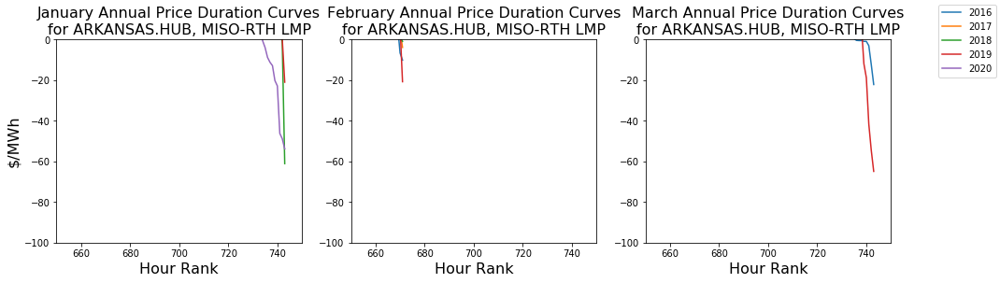

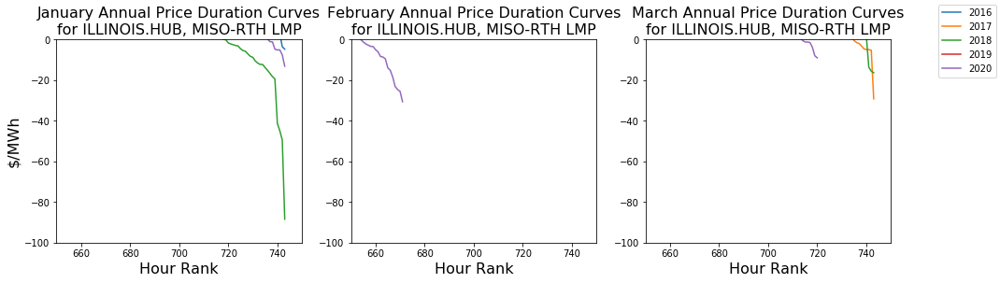

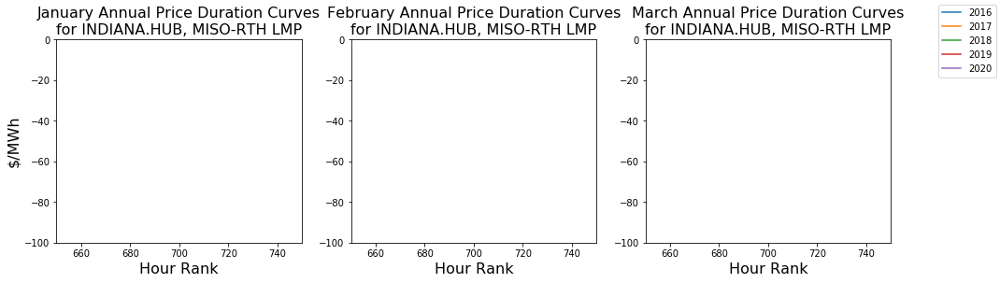

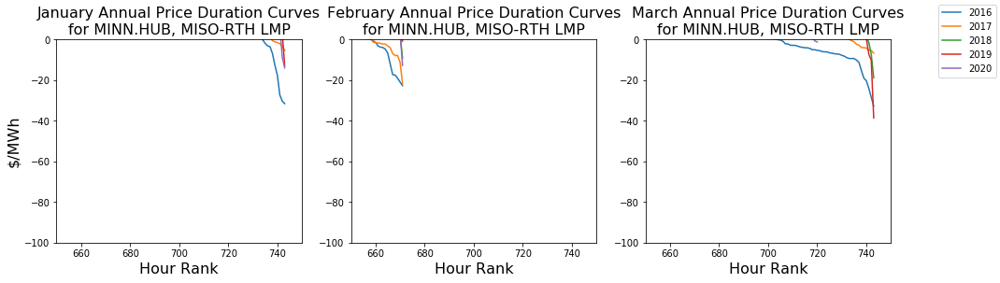

In [12]:
#this gives you a sense of negative RT prices
#Price duration curve for a month
def pdc_zero(df,m_list,hub="ILLINOIS.HUB",pricetype="MISO-RTH LMP"):
    
    assert(type(m_list))==list
    fig, axs = plt.subplots(nrows=1,ncols=3,figsize=(16, 4))
    counter = 0
    
    for month in m_list:
        month_frame = df.loc[(df['Price Node Name']==hub) & (df['Month']==month) & (df['Price Type Full Description']==pricetype)]
        if month==2:
            month_frame = month_frame.loc[month_frame['Day']!=29] #drop leap day

        data_dict = {}
        for y in month_frame['Year'].unique():
            year_frame = month_frame.loc[df['Year']==y]
            year_frame.sort_values(by='Price $/MWh',ascending=False,inplace=True)
            year_frame.reset_index(inplace=True)
            #data_dict[str(y)] = list(year_frame['Price $/MWh'])
            axs[counter].plot(np.asarray(year_frame.index),np.asarray(year_frame['Price $/MWh']),label=str(y))

        #plot_frame = pd.DataFrame.from_dict(data_dict)
        month_name = datetime.date(1900, int(month), 1).strftime('%B')
        axs[counter].set_title(month_name+" Annual Price Duration Curves\nfor "+hub+", "+pricetype,fontdict={'fontsize': '16', 'fontweight' : '1'})
        if counter==0:
            axs[counter].set_ylabel('$/MWh',fontdict={'fontsize': '16', 'fontweight' : '1'})
        axs[counter].set_xlabel('Hour Rank',fontdict={'fontsize': '16', 'fontweight' : '1'})
        
        axs[counter].set_ylim([-100, 0])
        axs[counter].set_xlim([650, 750])
        
        if counter==0:
            lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
            lines, labels = [sum(i, []) for i in zip(*lines_labels)]
            fig.legend(lines, labels, loc='upper right')
        counter+=1
    plt.show()
    return None
for node in MISO_LMP['Price Node Name'].unique():
    pdc_zero(MISO_LMP,[1,2,3],hub=node)

Just was curious if the spread between DA and RT prices has moved in a way that could be arbitraged by traders. It'd seem if load forecast errors are higher there could be higher deltas between DA and RT, though if forecast errors are unbiased this might not affect average prices much. Still, you'd figure the presence of smart traders and virtual bids would cause convergence in DA and RT prices over time.  

Anyway, there's little evidence here. Again the thing that stands out most is January 2018.

C:\Users\llavi\Anaconda4\lib\site-packages\ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\llavi\Anaconda4\lib\site-packages\ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


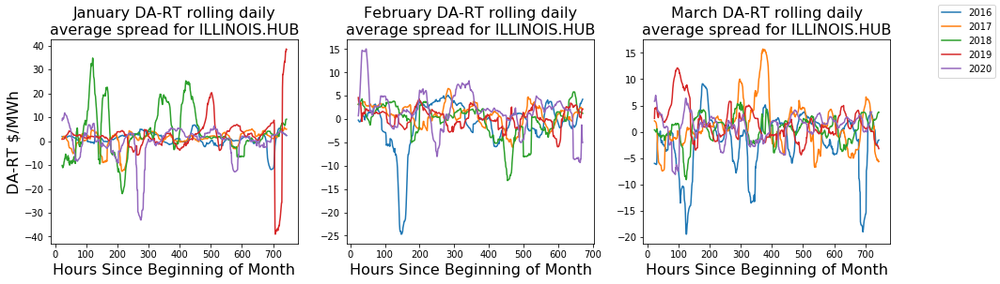

In [13]:
#delta between DA and RT prices, rolling average

def delta_RT_DA(df,m_list,hub="ILLINOIS.HUB"):
    
    assert(type(m_list))==list
    fig, axs = plt.subplots(nrows=1,ncols=3,figsize=(16, 4))
    counter = 0
    
    for month in m_list:
        month_frame_DA = df.loc[(df['Price Node Name']==hub) & (df['Month']==month) & (df['Price Type Full Description']=="MISO-DAH LMP")]
        month_frame_RT = df.loc[(df['Price Node Name']==hub) & (df['Month']==month) & (df['Price Type Full Description']=="MISO-RTH LMP")]
        if month==2:
            month_frame_DA = month_frame_DA.loc[month_frame_DA['Day']!=29] #drop leap day
            month_frame_RT = month_frame_RT.loc[month_frame_RT['Day']!=29]

        for y in month_frame_DA['Year'].unique():
            year_frame_DA = month_frame_DA.loc[month_frame_DA['Year']==y]
            year_frame_RT = month_frame_RT.loc[month_frame_RT['Year']==y]
            year_frame_DA.reset_index(inplace=True)
            year_frame_RT.reset_index(inplace=True)
            
            year_frame_DA['Delta'] = year_frame_DA['Price $/MWh'] - year_frame_RT['Price $/MWh']
            year_frame_DA['RollingAvg'] = year_frame_DA['Delta'].rolling(24).mean()
            axs[counter].plot(np.asarray(year_frame_DA.index),np.asarray(year_frame_DA['RollingAvg']),label=str(y))

        month_name = datetime.date(1900, int(month), 1).strftime('%B')
        axs[counter].set_title(month_name+" DA-RT rolling daily\naverage spread for "+hub,fontdict={'fontsize': '16', 'fontweight' : '1'})
        if counter==0:
            axs[counter].set_ylabel('DA-RT $/MWh',fontdict={'fontsize': '16', 'fontweight' : '1'})
        axs[counter].set_xlabel('Hours Since Beginning of Month',fontdict={'fontsize': '16', 'fontweight' : '1'})
        
        if counter==0:
            lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
            lines, labels = [sum(i, []) for i in zip(*lines_labels)]
            fig.legend(lines, labels, loc='upper right')
        counter+=1
    plt.show()
    return None
#for node in MISO_LMP['Price Node Name'].unique():
delta_RT_DA(MISO_LMP,[1,2,3])

Some quick creation of additional dataframe columns again

In [14]:
MISO_Zonal_Gen['PythonDatetime'] = [parser.parse(v) for v in list(MISO_Zonal_Gen['Local Datetime (Hour Beginning)'])]
MISO_Zonal_Gen['Month'] = [v.month for v in list(MISO_Zonal_Gen['PythonDatetime'])]
MISO_Zonal_Gen['Year'] = [v.year for v in list(MISO_Zonal_Gen['PythonDatetime'])]
MISO_Zonal_Gen['Day'] = [v.day for v in list(MISO_Zonal_Gen['PythonDatetime'])]

Breakdown of generation in MISO by fuel type for first three months of the year over the past 5 years.

- It appears two large nuclear units went offline in mid-March 2020, perhaps in response to COVID or declining load? One in MISO Central, one in MISO South

- Coal generation appears to just generally be in fairly precipitous decline this year in MISO North and MISO Central, though nothing special about March in this regard.

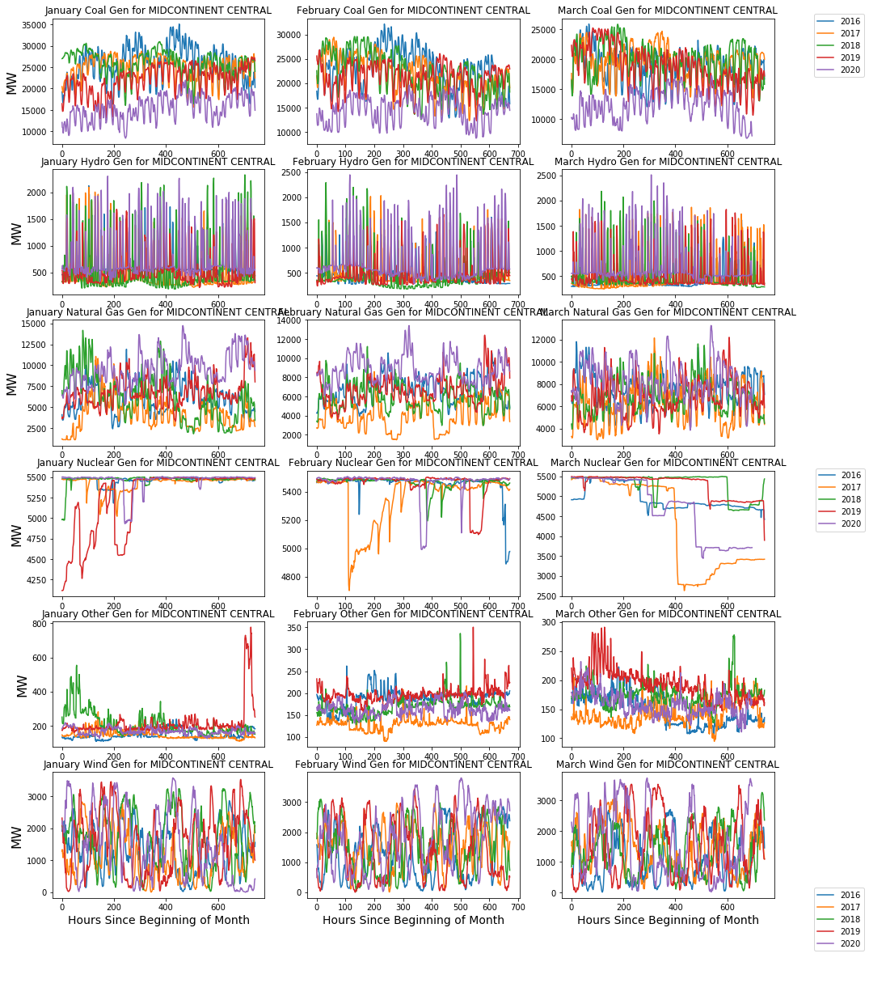

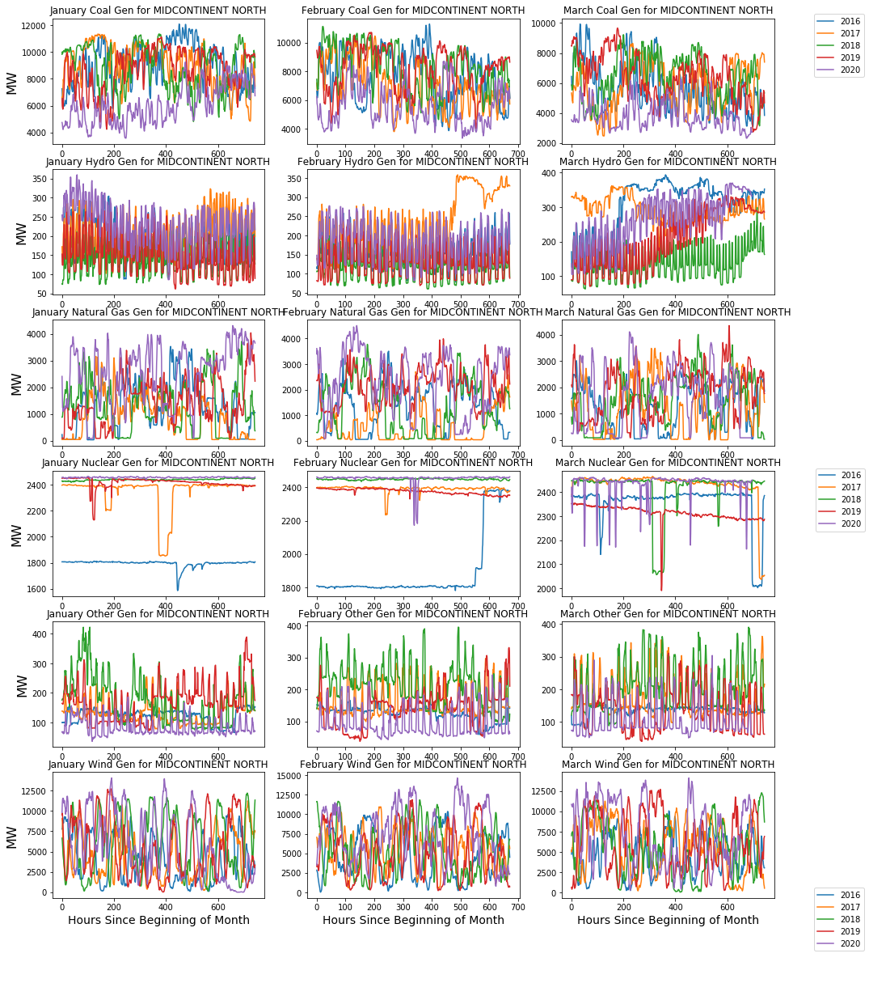

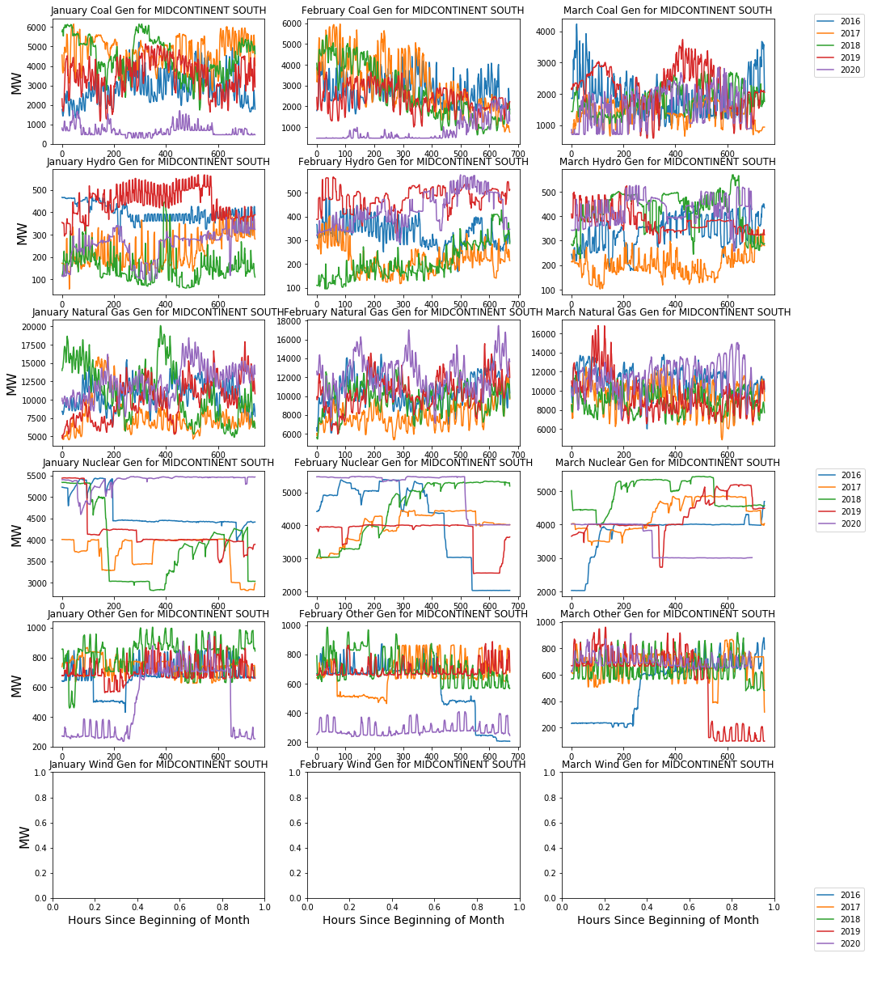

In [15]:
def zonal_gen(df,m_list,hub="MIDCONTINENT CENTRAL"):
    
    assert(type(m_list))==list
    fig, axs = plt.subplots(nrows=6,ncols=3,figsize=(16, 20))
    counter = 0
    
    for fuel in df['Fuel Type'].unique():
        counter2 = 0
        for month in m_list:
            month_frame = df.loc[(df['Generation Region']==hub) & (df['Month']==month) & (df['Fuel Type']==fuel)]
            if month==2:
                month_frame = month_frame.loc[month_frame['Day']!=29] #drop leap day
                
            for y in month_frame['Year'].unique():
                year_frame = month_frame.loc[df['Year']==y]
                year_frame.reset_index(inplace=True)
                axs[counter,counter2].plot(np.asarray(year_frame.index),np.asarray(year_frame['Sum Generation MW']),label=str(y))

            month_name = datetime.date(1900, int(month), 1).strftime('%B')
            axs[counter,counter2].set_title(month_name+" "+fuel+" Gen for "+hub,
                                   fontdict={'fontsize': '12', 'fontweight' : '1'})
            if counter2==0:
                axs[counter,counter2].set_ylabel('MW',fontdict={'fontsize': '16', 'fontweight' : '1'})
            if counter==5:
                axs[counter,counter2].set_xlabel('Hours Since Beginning of Month',fontdict={'fontsize': '14', 'fontweight' : '1'})
            
            if counter2==0 and counter==0:
                lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
                lines, labels = [sum(i, []) for i in zip(*lines_labels)]
                #fig.legend(lines, labels, loc='upper right')
                fig.legend(lines, labels, loc='right')
                fig.legend(lines, labels, bbox_to_anchor=(.87, .1), loc=2)
                fig.legend(lines, labels, bbox_to_anchor=(.87, .85), loc=2)
            counter2+=1
        counter+=1
    plt.show()
    return None

for h in MISO_Zonal_Gen['Generation Region'].unique():
    zonal_gen(MISO_Zonal_Gen,[1,2,3],hub=h)

again, creating some columns in the dataframe

In [16]:
MISO_Zonal_Gen_Forecast['PythonDatetime'] = [parser.parse(v) for v in list(MISO_Zonal_Gen_Forecast['Local Datetime (Hour Beginning)'])]
MISO_Zonal_Gen_Forecast['Month'] = [v.month for v in list(MISO_Zonal_Gen_Forecast['PythonDatetime'])]
MISO_Zonal_Gen_Forecast['Year'] = [v.year for v in list(MISO_Zonal_Gen_Forecast['PythonDatetime'])]
MISO_Zonal_Gen_Forecast['Day'] = [v.day for v in list(MISO_Zonal_Gen_Forecast['PythonDatetime'])]

DA cleared v. actual generation by fuel type. Just seeing if there's some bias in who ends up not online in March 2020 if load forecasts are missing in either direction.

Nothing really stands out to me.

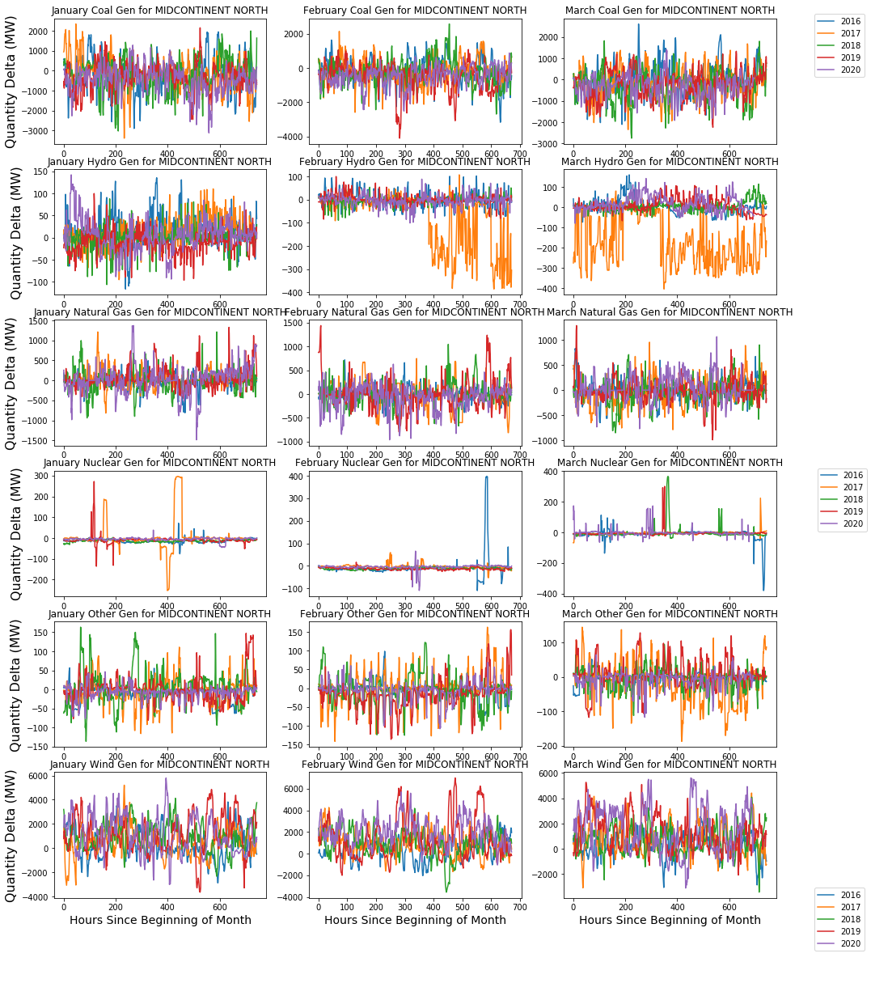

In [17]:
def zonal_gen_forecast(df,m_list,hub="MIDCONTINENT NORTH"):
    
    assert(type(m_list))==list
    fig, axs = plt.subplots(nrows=6,ncols=3,figsize=(16, 20))
    counter = 0
    
    for fuel in df['Fuel Type'].unique():
        counter2 = 0
        for month in m_list:
            month_frame = df.loc[(df['Reporting Area Name']==hub) & (df['Month']==month) & (df['Fuel Type']==fuel)]
            if month==2:
                month_frame = month_frame.loc[month_frame['Day']!=29] #drop leap day
                
            for y in month_frame['Year'].unique():
                year_frame = month_frame.loc[df['Year']==y]
                year_frame.reset_index(inplace=True)
                axs[counter,counter2].plot(np.asarray(year_frame.index),np.asarray(year_frame['Most Recent Average Quantity Difference MW']),label=str(y))

            month_name = datetime.date(1900, int(month), 1).strftime('%B')
            axs[counter,counter2].set_title(month_name+" "+fuel+" Gen for "+hub,
                                   fontdict={'fontsize': '12', 'fontweight' : '1'})
            if counter2==0:
                axs[counter,counter2].set_ylabel('Quantity Delta (MW)',fontdict={'fontsize': '16', 'fontweight' : '1'})
            if counter==5:
                axs[counter,counter2].set_xlabel('Hours Since Beginning of Month',fontdict={'fontsize': '14', 'fontweight' : '1'})
            
            if counter2==0 and counter==0:
                lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
                lines, labels = [sum(i, []) for i in zip(*lines_labels)]
                #fig.legend(lines, labels, loc='upper right')
                fig.legend(lines, labels, loc='right')
                fig.legend(lines, labels, bbox_to_anchor=(.87, .1), loc=2)
                fig.legend(lines, labels, bbox_to_anchor=(.87, .85), loc=2)
            counter2+=1
        counter+=1
    plt.show()
    return None

#for h in MISO_Zonal_Gen['Generation Region'].unique():
zonal_gen_forecast(MISO_Zonal_Gen_Forecast,[1,2,3])

In [18]:
#interface congestion
MISO_Interface_Congestion['PythonDatetime'] = [parser.parse(v) for v in list(MISO_Interface_Congestion['Local Datetime (Hour Ending)'])]
MISO_Interface_Congestion['Month'] = [v.month for v in list(MISO_Interface_Congestion['PythonDatetime'])]
MISO_Interface_Congestion['Year'] = [v.year for v in list(MISO_Interface_Congestion['PythonDatetime'])]
MISO_Interface_Congestion['Day'] = [v.day for v in list(MISO_Interface_Congestion['PythonDatetime'])]
#print(MISO_Interface_Congestion['Price Node Name'].unique())

['AEC' 'AECI' 'AEP' 'AP' 'CE' 'CPLE' 'CPLW' 'CSWS' 'DEOK' 'DLCO' 'DPL'
 'DUK' 'EDE' 'EEI' 'EKPC' 'FE' 'GLHB' 'GRDA' 'INDN' 'KACY' 'KCPL' 'LES'
 'LGEE' 'MHEB' 'MPS' 'NPPD' 'NYISO' 'OKGE' 'ONT' 'ONT.DECO.PSOUT' 'ONT_W'
 'OPPD' 'PJMC' 'PSEC' 'PSEG' 'SCEG' 'SECI' 'SOCO' 'SPA' 'SPC' 'SPRM' 'SPS'
 'SWPP' 'TVA' 'VAP' 'WAUE' 'WFEC' 'WR' 'YAD']


I looked at some stuff related to congestion at interfaces with MISO here. Nothing really stood out in terms of persistance price differences across interfaces. Not sure why there would be, necessarily, but there were some weird trends in PJM Classic & Dominion on 4/1/2020  (admittedly, not really a MISO interface). I can provide a link if needed.

C:\Users\llavi\Anaconda4\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\llavi\Anaconda4\lib\site-packages\ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


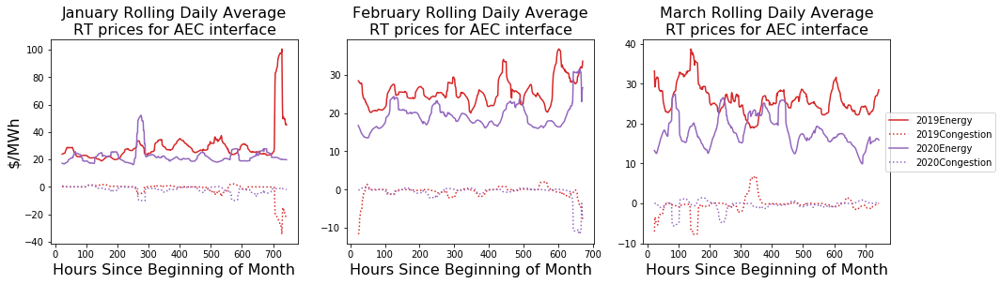

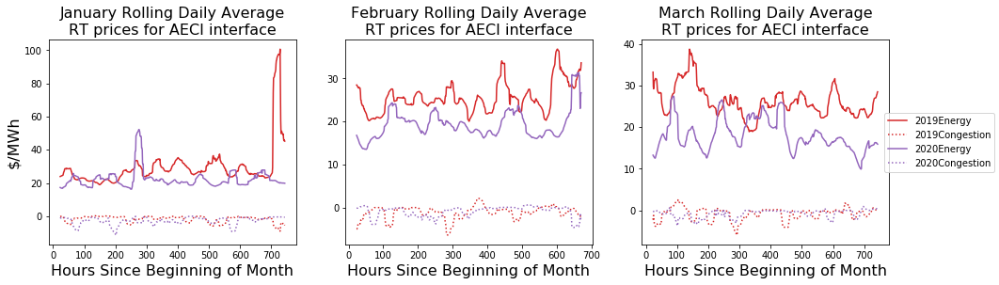

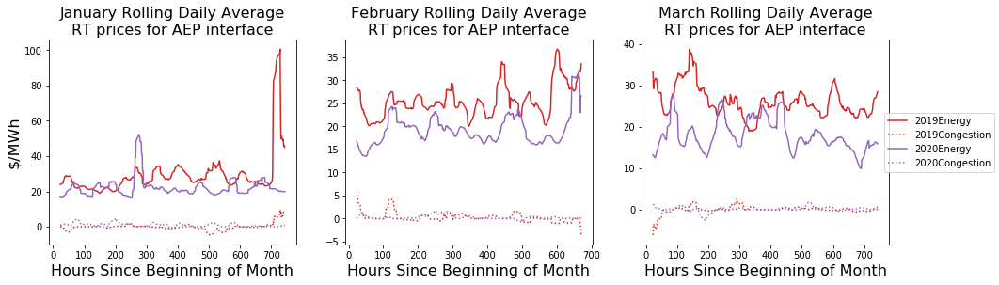

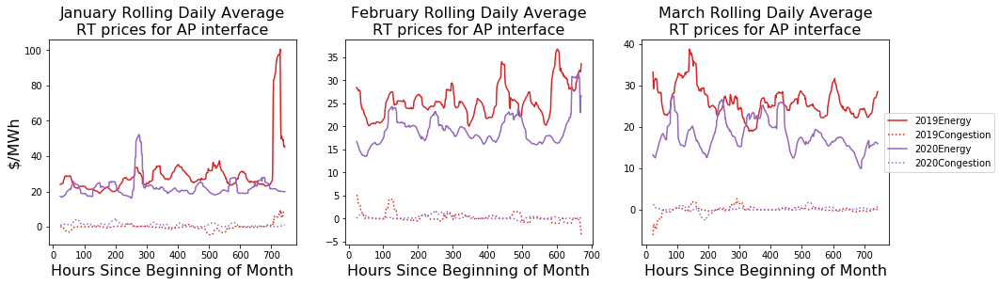

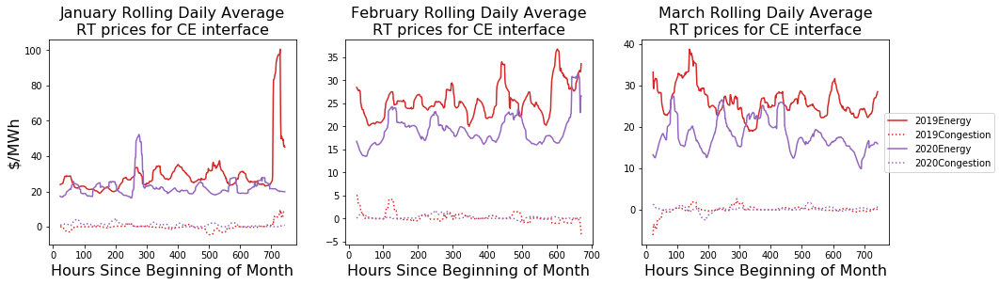

...

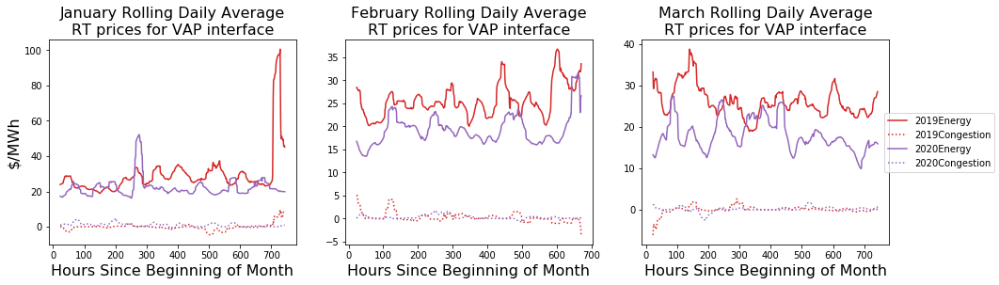

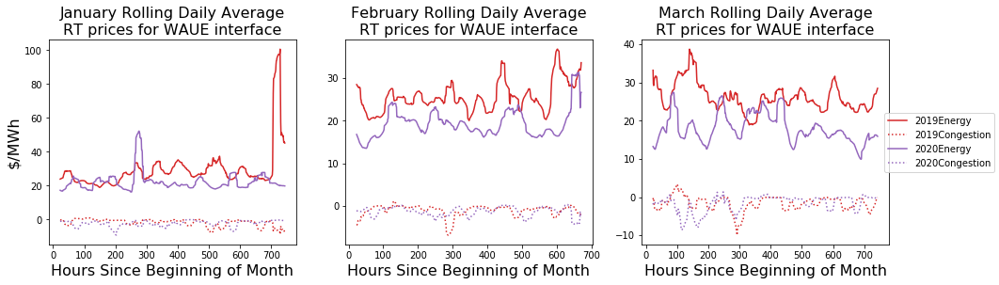

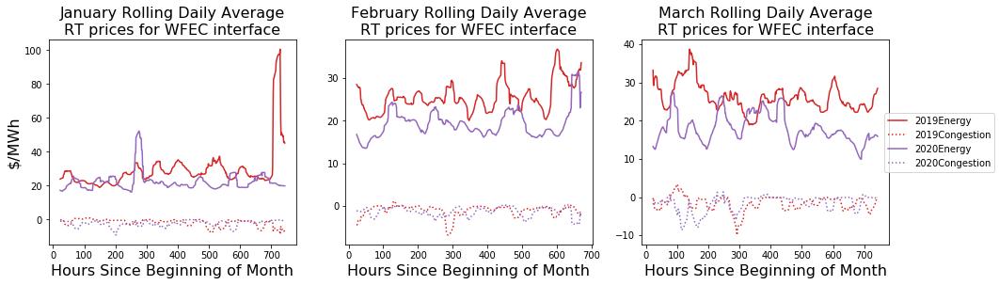

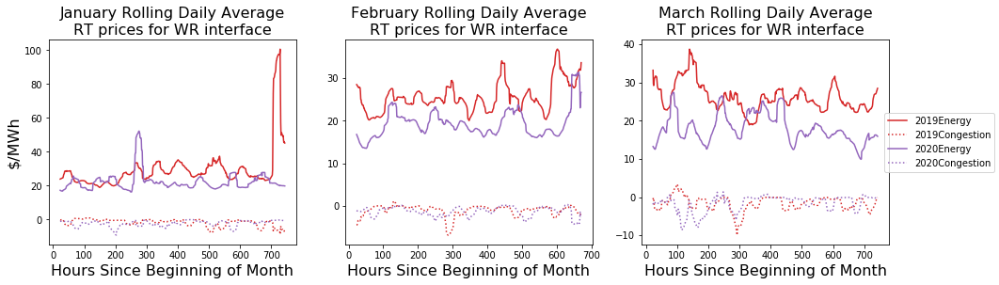

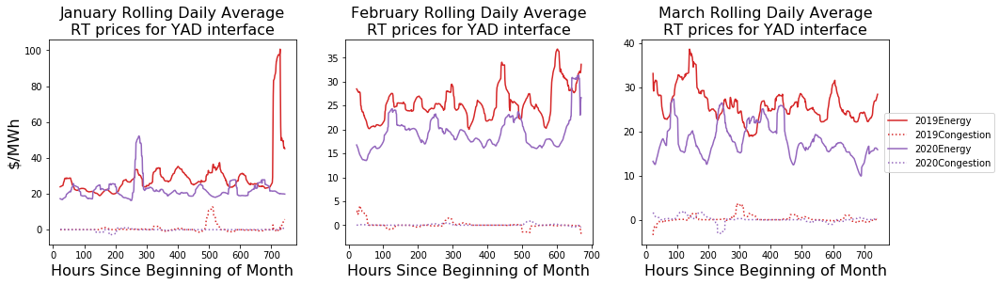

In [20]:
#hub congestion
#MISO_Hub_Congestion
def interface_congestion(df,m_list,hub="PJMC"):
    
    assert(type(m_list))==list
    fig, axs = plt.subplots(nrows=1,ncols=3,figsize=(16, 4))
    counter = 0
    
    for month in m_list:
        month_frame = df.loc[(df['Price Node Name']==hub) & (df['Month']==month)]
        if month==2:
            month_frame = month_frame.loc[month_frame['Day']!=29] #drop leap day
        
        yearcount = 3
        for y in month_frame['Year'].unique():
            year_frame = month_frame.loc[month_frame['Year']==y]            
            year_frame.reset_index(inplace=True)
            
            year_frame['RollingAvgEnergy'] = year_frame['Energy Price $/MWh'].rolling(24).mean()
            year_frame['RollingAvgCongestion'] = year_frame['Congestion Price $/MWh'].rolling(24).mean()
            color_label = 'C'+str(yearcount)
            axs[counter].plot(np.asarray(year_frame.index),np.asarray(year_frame['RollingAvgEnergy']),
                              color=color_label,label=str(y)+'Energy')
            axs[counter].plot(np.asarray(year_frame.index),np.asarray(year_frame['RollingAvgCongestion']),
                              color=color_label,linestyle='dotted',label=str(y)+'Congestion')
            yearcount+=1
        month_name = datetime.date(1900, int(month), 1).strftime('%B')
        axs[counter].set_title(month_name+" Rolling Daily Average\nRT prices for "+hub+' interface',fontdict={'fontsize': '16', 'fontweight' : '1'})
        if counter==0:
            axs[counter].set_ylabel('$/MWh',fontdict={'fontsize': '16', 'fontweight' : '1'})
        axs[counter].set_xlabel('Hours Since Beginning of Month',fontdict={'fontsize': '16', 'fontweight' : '1'})
        
        if counter==0:
            lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
            lines, labels = [sum(i, []) for i in zip(*lines_labels)]
            fig.legend(lines, labels, loc='right')
        counter+=1
    plt.show()
    return None

for h in MISO_Interface_Congestion['Price Node Name'].unique():
    interface_congestion(MISO_Interface_Congestion,[1,2,3],hub=h)

In [21]:
MISO_Hub_Congestion['PythonDatetime'] = [parser.parse(v) for v in list(MISO_Hub_Congestion['Local Datetime (Hour Ending)'])]
MISO_Hub_Congestion['Month'] = [v.month for v in list(MISO_Hub_Congestion['PythonDatetime'])]
MISO_Hub_Congestion['Year'] = [v.year for v in list(MISO_Hub_Congestion['PythonDatetime'])]
MISO_Hub_Congestion['Day'] = [v.day for v in list(MISO_Hub_Congestion['PythonDatetime'])]

C:\Users\llavi\Anaconda4\lib\site-packages\ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\llavi\Anaconda4\lib\site-packages\ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


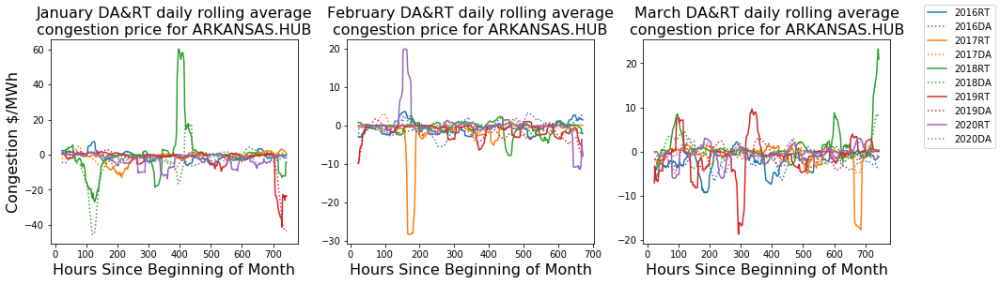

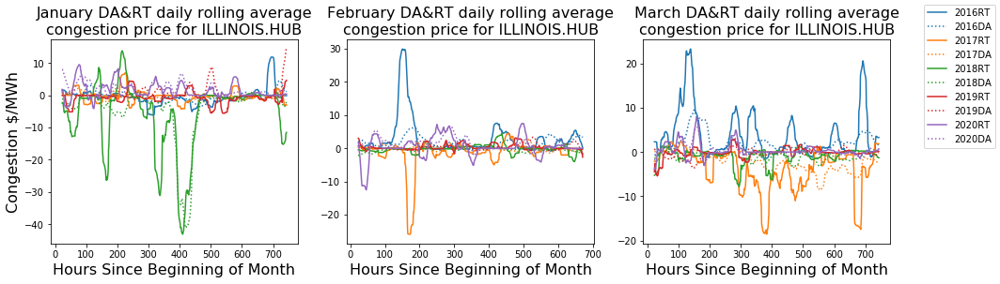

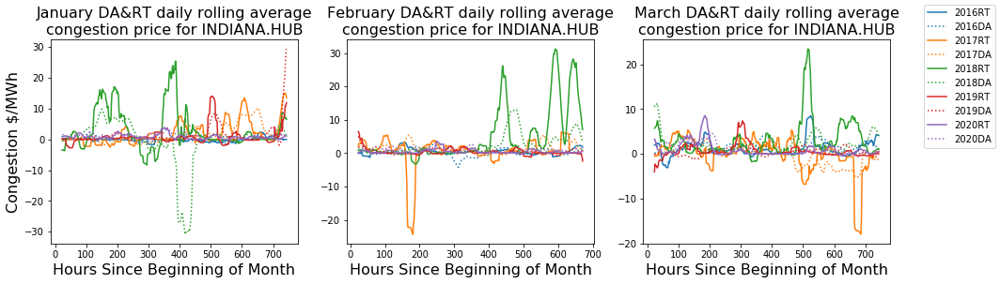

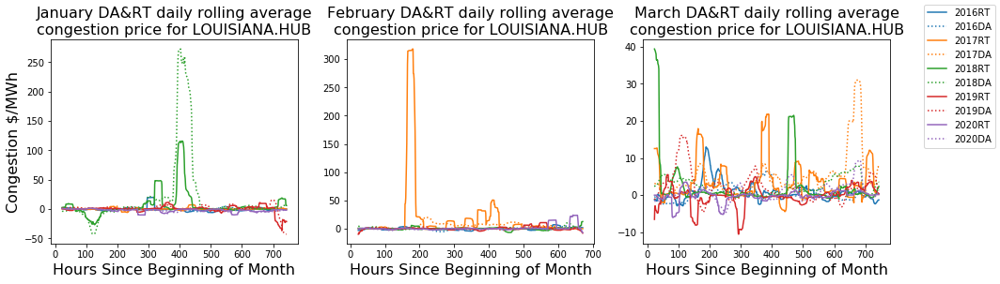

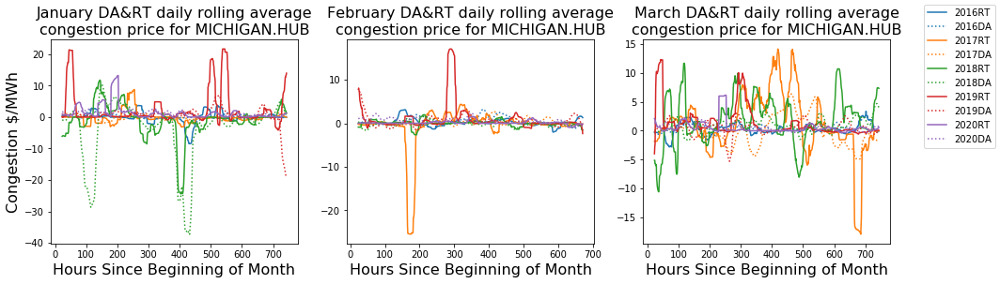

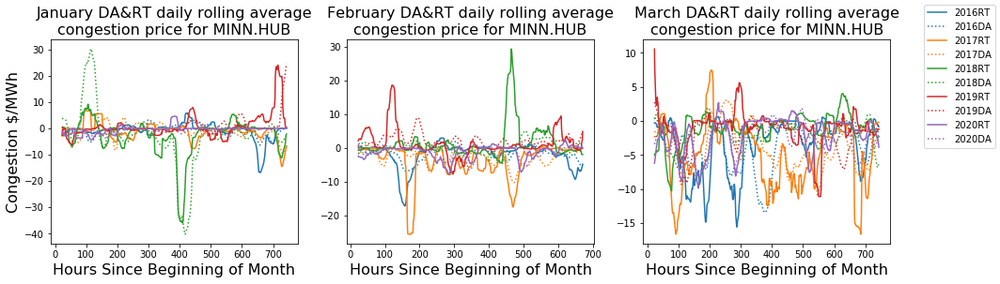

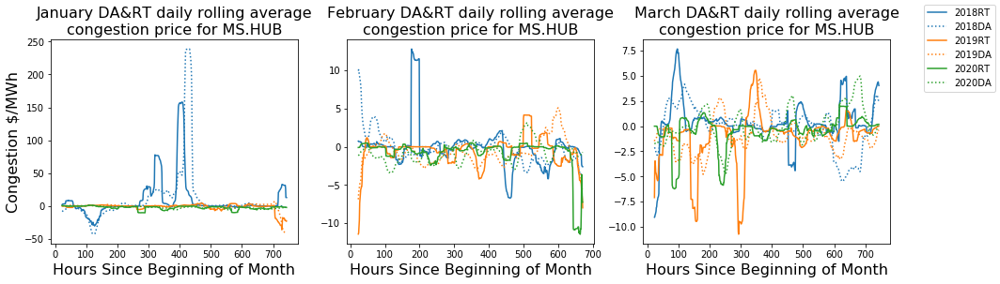

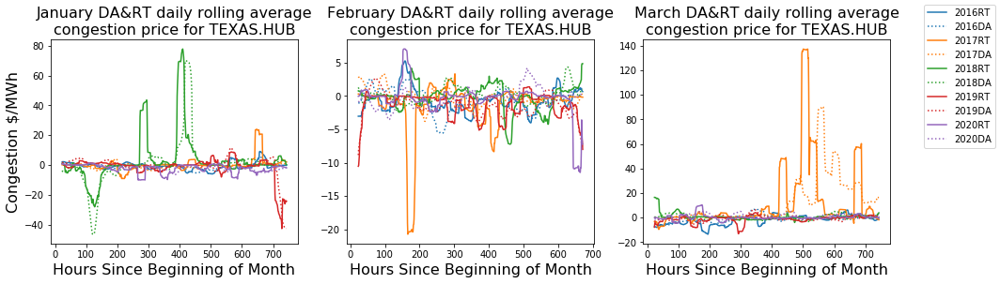

In [22]:
#hub congestion
#MISO_Hub_Congestion
def hub_congestion(df,m_list,hub="ILLINOIS.HUB"):
    
    assert(type(m_list))==list
    fig, axs = plt.subplots(nrows=1,ncols=3,figsize=(16, 4))
    counter = 0
    
    for month in m_list:
        month_frame_DA = df.loc[(df['Price Node Name']==hub) & (df['Month']==month) & (df['Market']=="DAH")]
        month_frame_RT = df.loc[(df['Price Node Name']==hub) & (df['Month']==month) & (df['Market']=="RTH")]
        if month==2:
            month_frame_DA = month_frame_DA.loc[month_frame_DA['Day']!=29] #drop leap day
            month_frame_RT = month_frame_RT.loc[month_frame_RT['Day']!=29]
        
        yearcount = 0
        for y in month_frame_DA['Year'].unique():
            year_frame_DA = month_frame_DA.loc[month_frame_DA['Year']==y]
            year_frame_RT = month_frame_RT.loc[month_frame_RT['Year']==y]
            year_frame_DA.reset_index(inplace=True)
            year_frame_RT.reset_index(inplace=True)
            
            #year_frame_DA['Delta'] = year_frame_DA['Price $/MWh'] - year_frame_RT['Price $/MWh']
            year_frame_RT['RollingAvg'] = year_frame_RT['Congestion Price $/MWh'].rolling(24).mean()
            year_frame_DA['RollingAvg'] = year_frame_DA['Congestion Price $/MWh'].rolling(24).mean()
            color_label = 'C'+str(yearcount)
            axs[counter].plot(np.asarray(year_frame_RT.index),np.asarray(year_frame_RT['RollingAvg']),
                              color=color_label,label=str(y)+'RT')
            axs[counter].plot(np.asarray(year_frame_DA.index),np.asarray(year_frame_DA['RollingAvg']),
                              color=color_label,linestyle='dotted',label=str(y)+'DA')
            yearcount+=1
        month_name = datetime.date(1900, int(month), 1).strftime('%B')
        axs[counter].set_title(month_name+" DA&RT daily rolling average\ncongestion price for "+hub,fontdict={'fontsize': '16', 'fontweight' : '1'})
        if counter==0:
            axs[counter].set_ylabel('Congestion $/MWh',fontdict={'fontsize': '16', 'fontweight' : '1'})
        axs[counter].set_xlabel('Hours Since Beginning of Month',fontdict={'fontsize': '16', 'fontweight' : '1'})
        
        if counter==0:
            lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
            lines, labels = [sum(i, []) for i in zip(*lines_labels)]
            fig.legend(lines, labels, loc='upper right')
        counter+=1
    plt.show()
    return None

for h in MISO_Hub_Congestion['Price Node Name'].unique():
    hub_congestion(MISO_Hub_Congestion,[1,2,3],hub=h)

In [24]:
MISO_Outage_Forecast['PythonDatetime'] = [parser.parse(v) for v in list(MISO_Outage_Forecast['Local Datetime (Hour Beginning)'])]
MISO_Outage_Forecast['PythonForecastLocalDatetime'] = [parser.parse(v) for v in list(MISO_Outage_Forecast['Forecast Local Datetime'])]
MISO_Outage_Forecast['Month'] = [v.month for v in list(MISO_Outage_Forecast['PythonDatetime'])]
MISO_Outage_Forecast['Year'] = [v.year for v in list(MISO_Outage_Forecast['PythonDatetime'])]
MISO_Outage_Forecast['Day'] = [v.day for v in list(MISO_Outage_Forecast['PythonDatetime'])]
MISO_Outage_Forecast['TimeDelta'] = MISO_Outage_Forecast['PythonDatetime']-MISO_Outage_Forecast['PythonForecastLocalDatetime']
#MISO_Outage_Forecast.head

Finally, a quick look at weekly forecast outages. It looks like these forecasts are updated weekly with 365-day look-ahead, so I plotted only the forecast that occured 6 days in advance of the relevant week. You can see that in the past couple weeks of 2020 the line starts to diverge quite meaningfully from historical scheduled outages, which tend to continue upward for a few more weeks into April before declining again to a minimum between 5 and 10 GW in July/August for peak summer loads.

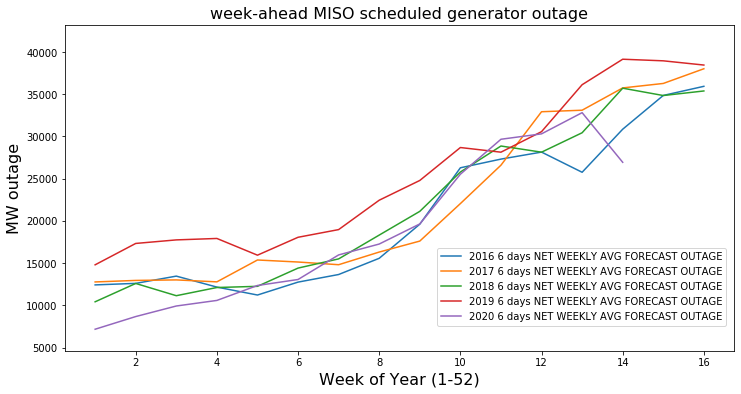

In [37]:

fig, axs = plt.subplots(nrows=1,ncols=1,figsize=(12, 6))
for v in MISO_Outage_Forecast['Forecast Description'].unique():
    color_counter = 0
    for y in range(2016,2021):#MISO_Outage_Forecast['Year'].unique():
        for dayahead in ['6 days']:
            df = MISO_Outage_Forecast[(MISO_Outage_Forecast['Forecast Description']==v) & (MISO_Outage_Forecast['Year']==y) & (MISO_Outage_Forecast['TimeDelta']==pd.Timedelta(dayahead))]
            df.reset_index(inplace=True)
            if v=='NET WEEKLY AVG FORECAST OUTAGE' and dayahead!='83 days':
                lty = 'solid'
                myalpha = 1
                mylabel = str(y)+' '+dayahead+' '+str(v)
            elif v=='NET WEEKLY AVG FORECAST OUTAGE' and dayahead=='83 days':
                lty='dashed'
                myalpha=1
                mylabel = str(y)+' '+dayahead+' '+str(v)
            else:
                lty = 'dashed'
                myalpha=0
                mylabel = ''

            #limit weeks
            df_short = df[df.index<=15]
            axs.plot(np.asarray(df_short.index+1),np.asarray(df_short['Sum Forecast Generation Outage']),
                     label=mylabel,color='C'+str(color_counter),linestyle=lty,
                    alpha=myalpha)
        color_counter+=1

axs.set_title('week-ahead MISO scheduled generator outage',fontdict={'fontsize': '16', 'fontweight' : '1'})
axs.set_ylabel('MW outage',fontdict={'fontsize': '16', 'fontweight' : '1'})
axs.set_xlabel('Week of Year (1-52)',fontdict={'fontsize': '16', 'fontweight' : '1'})

lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
lines, labels = [sum(i, []) for i in zip(*lines_labels)]
#fig.legend(lines, labels, loc='right')
fig.legend(lines, labels, bbox_to_anchor=(.5, .35), loc=2)
plt.savefig('Outage.png')
plt.show()
        